<a href="https://colab.research.google.com/github/YusrilHasanuddin/BATIK-WGAN-WGAN-GP/blob/main/WGAN_Playground.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/YusrilHasanuddin/DataSetBatik

Cloning into 'DataSetBatik'...
remote: Enumerating objects: 41974, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 41974 (delta 3), reused 9 (delta 2), pack-reused 41963
Receiving objects: 100% (41974/41974), 2.26 GiB | 12.71 MiB/s, done.
Resolving deltas: 100% (10/10), done.
Checking out files: 100% (35504/35504), done.


In [2]:
!mkdir data
!mv DataSetBatik/CitraBatik/* data
!ls data

Streaming output truncated to the last 5000 lines.
010-018.jpg  069-035.jpg  128-052.jpg  187-069.jpg  246-086.jpg  306-003.jpg
010-019.jpg  069-036.jpg  128-053.jpg  187-070.jpg  246-087.jpg  306-004.jpg
010-020.jpg  069-037.jpg  128-054.jpg  187-071.jpg  246-088.jpg  306-005.jpg
010-021.jpg  069-038.jpg  128-055.jpg  187-072.jpg  246-089.jpg  306-006.jpg
010-022.jpg  069-039.jpg  128-056.jpg  187-073.jpg  246-090.jpg  306-007.jpg
010-023.jpg  069-040.jpg  128-057.jpg  187-074.jpg  246-091.jpg  306-008.jpg
010-024.jpg  069-041.jpg  128-058.jpg  187-075.jpg  246-092.jpg  306-009.jpg
010-025.jpg  069-042.jpg  128-059.jpg  187-076.jpg  246-093.jpg  306-010.jpg
010-026.jpg  069-043.jpg  128-060.jpg  187-077.jpg  246-094.jpg  306-011.jpg
010-027.jpg  069-044.jpg  128-061.jpg  187-078.jpg  246-095.jpg  306-012.jpg
010-028.jpg  069-045.jpg  128-062.jpg  187-079.jpg  246-096.jpg  306-013.jpg
010-029.jpg  069-046.jpg  128-063.jpg  187-080.jpg  246-097.jpg  306-014.jpg
010-030.jpg  069-047.jpg 

In [3]:
path = "data/"


import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(64, 64), batch_size=256 # update from 32
)

Found 35500 files belonging to 1 classes.


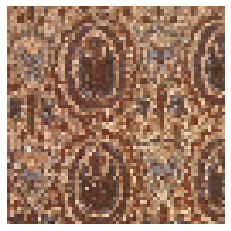

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

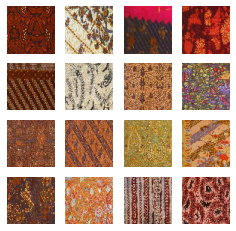

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 64 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))
    

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator() 

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 32768)             2129920   
                                                                 
 re_lu_9 (ReLU)              (None, 32768)             0         
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 16, 16, 256)      2097152   
 ranspose)                                                       
                                                                 
 batch_normalization_7 (Batc  (None, 16, 16, 256)      1024      
 hNormalization)                                                 
                                                                 
 re_lu_10 (ReLU)             (None, 16, 16, 256)       0 

In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
class WeightClipping(tf.keras.constraints.Constraint):
    def __init__(self, clip_value):
        self.clip_value = clip_value
    
    def __call__(self, weights):
        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
    
    def get_config(self):
        return {'clip_value': self.clip_value}

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    #UPDATE for WGAN: enfoce 1-Lipschitz constraint with weight clippping to [-1, 1] 
    constraint = WeightClipping(0.01)

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint, # UPDATE for WGAN
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2), 
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # UPDATE for WGAN: linear activation in the last layer. 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0    

In [ ]:
class WGAN(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps): # UPDATE
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN: remove the code of real / fake labels
    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # UPDATE for WGAN: we train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images 
            with tf.GradientTape() as tape:
                # Get the critic' predictions on the real images
                pred_real = self.critic(real_images, training=True)
                # Generate fake images from the latent noise
                fake_images = self.generator(noise, training=True) 
                # Get the critic' predictions on the fake images
                pred_fake = self.critic(fake_images, training=True)
                # Calculate the critic loss with wassertein loss function
                d_loss = self.d_loss_fn(pred_real, pred_fake)
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake) 
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator weights
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan = WGAN(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) # UPDATE for WGAN

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.00005 # UPDATE for WGAN: learning rate per WGAN paper

In [ ]:
wgan.compile(
    d_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    g_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/100
139/139 [==============================] - ETA: 0s - d_loss: -5.4045 - g_loss: 15.9135

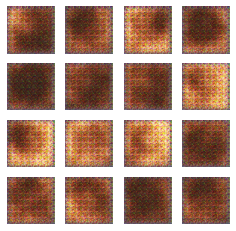

139/139 [==============================] - 186s 1s/step - d_loss: -5.4045 - g_loss: 15.9135
Epoch 2/100
139/139 [==============================] - ETA: 0s - d_loss: -17.6759 - g_loss: 18.0228

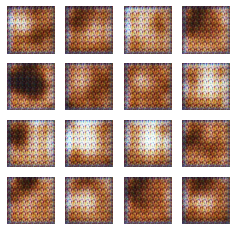

139/139 [==============================] - 152s 1s/step - d_loss: -17.6759 - g_loss: 18.0228
Epoch 3/100
139/139 [==============================] - ETA: 0s - d_loss: -33.0879 - g_loss: -11.7034

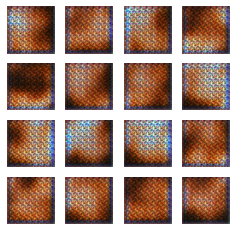

139/139 [==============================] - 153s 1s/step - d_loss: -33.0879 - g_loss: -11.7034
Epoch 4/100
139/139 [==============================] - ETA: 0s - d_loss: -34.7673 - g_loss: -11.2850

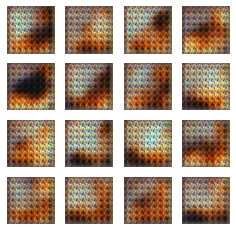

139/139 [==============================] - 153s 1s/step - d_loss: -34.7673 - g_loss: -11.2850
Epoch 5/100
139/139 [==============================] - ETA: 0s - d_loss: -42.9434 - g_loss: -35.6064

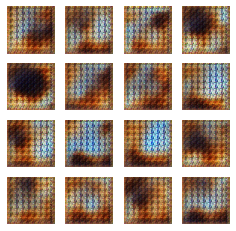

139/139 [==============================] - 153s 1s/step - d_loss: -42.9434 - g_loss: -35.6064
Epoch 6/100
139/139 [==============================] - ETA: 0s - d_loss: -52.1182 - g_loss: -38.0124

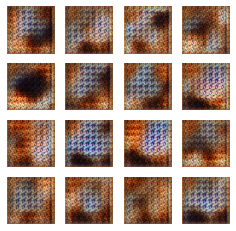

139/139 [==============================] - 153s 1s/step - d_loss: -52.1182 - g_loss: -38.0124
Epoch 7/100
139/139 [==============================] - ETA: 0s - d_loss: -60.5179 - g_loss: -18.5759

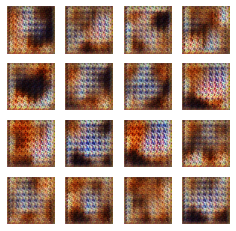

139/139 [==============================] - 153s 1s/step - d_loss: -60.5179 - g_loss: -18.5759
Epoch 8/100
139/139 [==============================] - ETA: 0s - d_loss: -65.3998 - g_loss: -6.3775

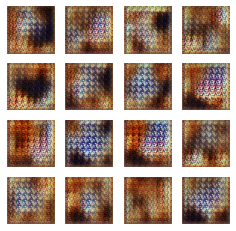

139/139 [==============================] - 153s 1s/step - d_loss: -65.3998 - g_loss: -6.3775
Epoch 9/100
139/139 [==============================] - ETA: 0s - d_loss: -77.5148 - g_loss: 0.8211

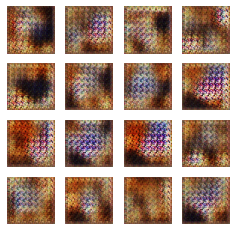

139/139 [==============================] - 153s 1s/step - d_loss: -77.5148 - g_loss: 0.8211
Epoch 10/100
139/139 [==============================] - ETA: 0s - d_loss: -85.9720 - g_loss: 32.2422

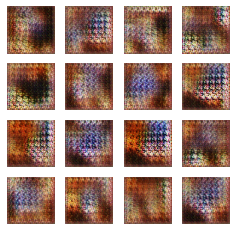

139/139 [==============================] - 153s 1s/step - d_loss: -85.9720 - g_loss: 32.2422
Epoch 11/100
139/139 [==============================] - ETA: 0s - d_loss: -86.9599 - g_loss: 11.6239

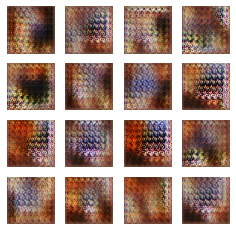

139/139 [==============================] - 153s 1s/step - d_loss: -86.9599 - g_loss: 11.6239
Epoch 12/100
139/139 [==============================] - ETA: 0s - d_loss: -90.6032 - g_loss: 38.8131

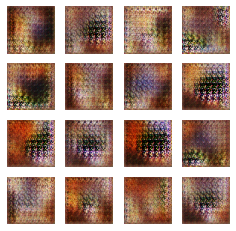

139/139 [==============================] - 153s 1s/step - d_loss: -90.6032 - g_loss: 38.8131
Epoch 13/100
139/139 [==============================] - ETA: 0s - d_loss: -90.8253 - g_loss: 16.4078

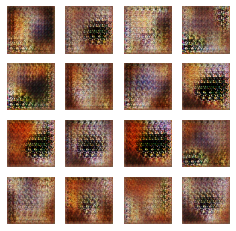

139/139 [==============================] - 153s 1s/step - d_loss: -90.8253 - g_loss: 16.4078
Epoch 14/100
139/139 [==============================] - ETA: 0s - d_loss: -88.5617 - g_loss: 8.1583

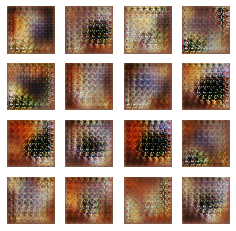

139/139 [==============================] - 153s 1s/step - d_loss: -88.5617 - g_loss: 8.1583
Epoch 15/100
139/139 [==============================] - ETA: 0s - d_loss: -91.6534 - g_loss: -37.3176

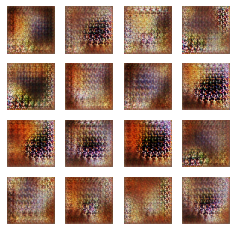

139/139 [==============================] - 153s 1s/step - d_loss: -91.6534 - g_loss: -37.3176
Epoch 16/100
139/139 [==============================] - ETA: 0s - d_loss: -89.7810 - g_loss: 16.2846

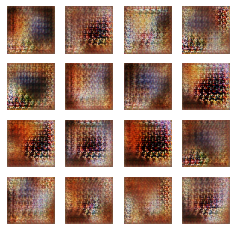

139/139 [==============================] - 153s 1s/step - d_loss: -89.7810 - g_loss: 16.2846
Epoch 17/100
139/139 [==============================] - ETA: 0s - d_loss: -94.5370 - g_loss: -10.9142

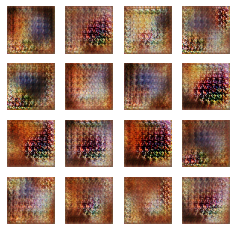

139/139 [==============================] - 154s 1s/step - d_loss: -94.5370 - g_loss: -10.9142
Epoch 18/100
139/139 [==============================] - ETA: 0s - d_loss: -95.2982 - g_loss: -2.9567

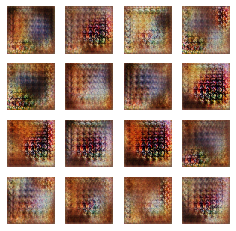

139/139 [==============================] - 153s 1s/step - d_loss: -95.2982 - g_loss: -2.9567
Epoch 19/100
139/139 [==============================] - ETA: 0s - d_loss: -92.3769 - g_loss: -50.7621

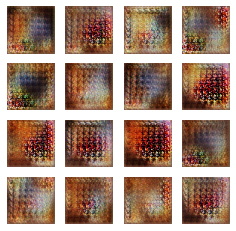

139/139 [==============================] - 153s 1s/step - d_loss: -92.3769 - g_loss: -50.7621
Epoch 20/100
139/139 [==============================] - ETA: 0s - d_loss: -92.9030 - g_loss: -62.9701

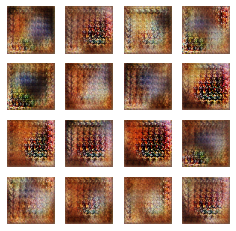

139/139 [==============================] - 153s 1s/step - d_loss: -92.9030 - g_loss: -62.9701
Epoch 21/100
139/139 [==============================] - ETA: 0s - d_loss: -90.6915 - g_loss: 27.6658

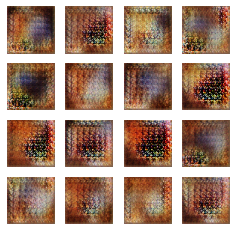

139/139 [==============================] - 153s 1s/step - d_loss: -90.6915 - g_loss: 27.6658
Epoch 22/100
139/139 [==============================] - ETA: 0s - d_loss: -91.4225 - g_loss: -36.2245

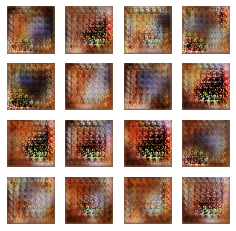

139/139 [==============================] - 153s 1s/step - d_loss: -91.4225 - g_loss: -36.2245
Epoch 23/100
139/139 [==============================] - ETA: 0s - d_loss: -93.8234 - g_loss: -42.9764

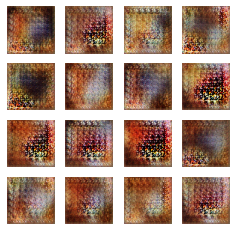

139/139 [==============================] - 153s 1s/step - d_loss: -93.8234 - g_loss: -42.9764
Epoch 24/100
139/139 [==============================] - ETA: 0s - d_loss: -92.1462 - g_loss: 88.3856

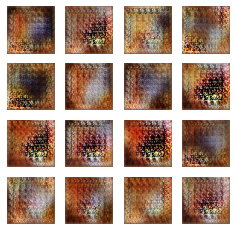

139/139 [==============================] - 154s 1s/step - d_loss: -92.1462 - g_loss: 88.3856
Epoch 25/100
139/139 [==============================] - ETA: 0s - d_loss: -90.6954 - g_loss: 59.1052

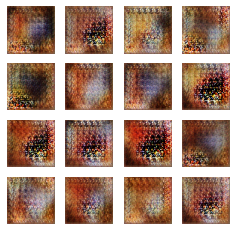

139/139 [==============================] - 153s 1s/step - d_loss: -90.6954 - g_loss: 59.1052
Epoch 26/100
139/139 [==============================] - ETA: 0s - d_loss: -91.0990 - g_loss: 107.6731

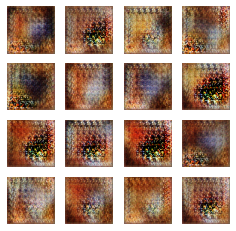

139/139 [==============================] - 153s 1s/step - d_loss: -91.0990 - g_loss: 107.6731
Epoch 27/100
139/139 [==============================] - ETA: 0s - d_loss: -88.1112 - g_loss: 180.7432

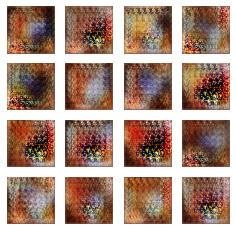

139/139 [==============================] - 153s 1s/step - d_loss: -88.1112 - g_loss: 180.7432
Epoch 28/100
139/139 [==============================] - ETA: 0s - d_loss: -88.6891 - g_loss: 201.2922

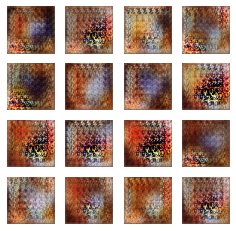

139/139 [==============================] - 153s 1s/step - d_loss: -88.6891 - g_loss: 201.2922
Epoch 29/100
139/139 [==============================] - ETA: 0s - d_loss: -82.8141 - g_loss: 18.1761

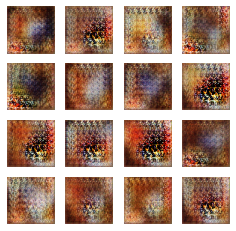

139/139 [==============================] - 153s 1s/step - d_loss: -82.8141 - g_loss: 18.1761
Epoch 30/100
139/139 [==============================] - ETA: 0s - d_loss: -88.3256 - g_loss: 158.0470

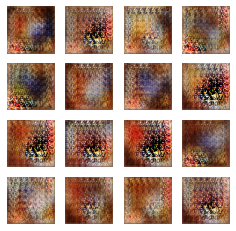

139/139 [==============================] - 153s 1s/step - d_loss: -88.3256 - g_loss: 158.0470
Epoch 31/100
139/139 [==============================] - ETA: 0s - d_loss: -91.0807 - g_loss: 119.7331

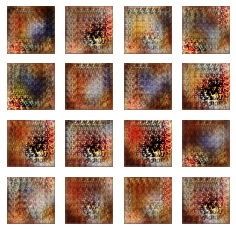

139/139 [==============================] - 153s 1s/step - d_loss: -91.0807 - g_loss: 119.7331
Epoch 32/100
139/139 [==============================] - ETA: 0s - d_loss: -84.8167 - g_loss: 183.1011

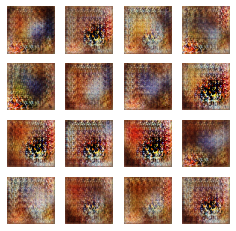

139/139 [==============================] - 154s 1s/step - d_loss: -84.8167 - g_loss: 183.1011
Epoch 33/100
139/139 [==============================] - ETA: 0s - d_loss: -78.7695 - g_loss: 168.2050

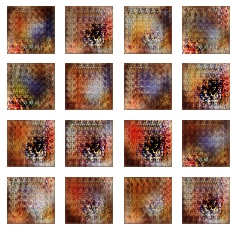

139/139 [==============================] - 153s 1s/step - d_loss: -78.7695 - g_loss: 168.2050
Epoch 34/100
139/139 [==============================] - ETA: 0s - d_loss: -81.5898 - g_loss: 152.3272

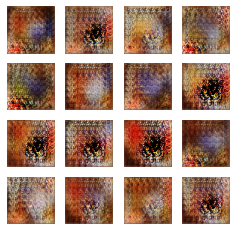

139/139 [==============================] - 153s 1s/step - d_loss: -81.5898 - g_loss: 152.3272
Epoch 35/100
139/139 [==============================] - ETA: 0s - d_loss: -75.4588 - g_loss: 170.5941

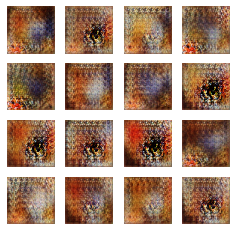

139/139 [==============================] - 153s 1s/step - d_loss: -75.4588 - g_loss: 170.5941
Epoch 36/100
139/139 [==============================] - ETA: 0s - d_loss: -73.9733 - g_loss: 366.6213

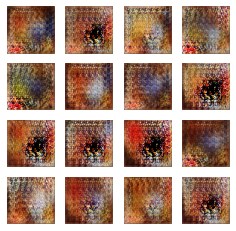

139/139 [==============================] - 153s 1s/step - d_loss: -73.9733 - g_loss: 366.6213
Epoch 37/100
139/139 [==============================] - ETA: 0s - d_loss: -72.0524 - g_loss: 232.1227

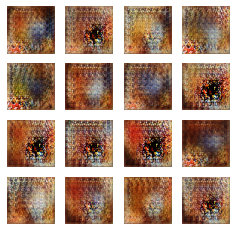

139/139 [==============================] - 153s 1s/step - d_loss: -72.0524 - g_loss: 232.1227
Epoch 38/100
139/139 [==============================] - ETA: 0s - d_loss: -64.6245 - g_loss: 316.7580

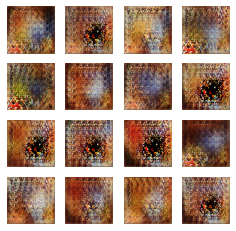

139/139 [==============================] - 153s 1s/step - d_loss: -64.6245 - g_loss: 316.7580
Epoch 39/100
139/139 [==============================] - ETA: 0s - d_loss: -66.4547 - g_loss: 503.7356

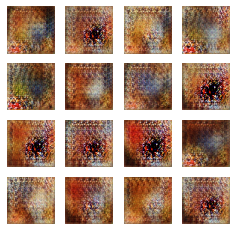

139/139 [==============================] - 154s 1s/step - d_loss: -66.4547 - g_loss: 503.7356
Epoch 40/100
139/139 [==============================] - ETA: 0s - d_loss: -64.5621 - g_loss: 326.7223

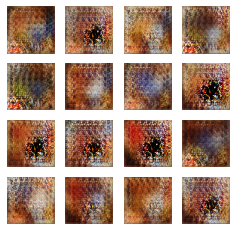

139/139 [==============================] - 153s 1s/step - d_loss: -64.5621 - g_loss: 326.7223
Epoch 41/100
139/139 [==============================] - ETA: 0s - d_loss: -60.9559 - g_loss: 580.4534

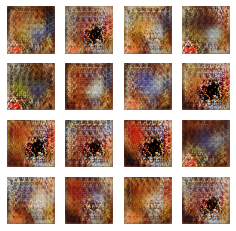

139/139 [==============================] - 153s 1s/step - d_loss: -60.9559 - g_loss: 580.4534
Epoch 42/100
139/139 [==============================] - ETA: 0s - d_loss: -61.5297 - g_loss: 351.7617

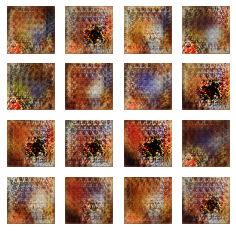

139/139 [==============================] - 153s 1s/step - d_loss: -61.5297 - g_loss: 351.7617
Epoch 43/100
139/139 [==============================] - ETA: 0s - d_loss: -60.8499 - g_loss: 580.3033

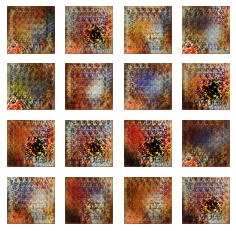

139/139 [==============================] - 153s 1s/step - d_loss: -60.8499 - g_loss: 580.3033
Epoch 44/100
139/139 [==============================] - ETA: 0s - d_loss: -60.6980 - g_loss: 598.3066

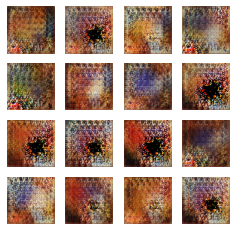

139/139 [==============================] - 154s 1s/step - d_loss: -60.6980 - g_loss: 598.3066
Epoch 45/100
139/139 [==============================] - ETA: 0s - d_loss: -57.5420 - g_loss: 712.4843

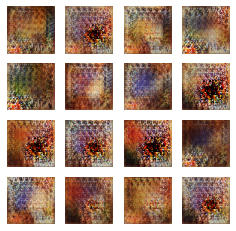

139/139 [==============================] - 153s 1s/step - d_loss: -57.5420 - g_loss: 712.4843
Epoch 46/100
139/139 [==============================] - ETA: 0s - d_loss: -56.2506 - g_loss: 697.5125

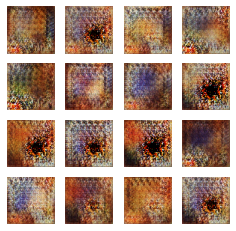

139/139 [==============================] - 153s 1s/step - d_loss: -56.2506 - g_loss: 697.5125
Epoch 47/100
139/139 [==============================] - ETA: 0s - d_loss: -53.2114 - g_loss: 732.8029

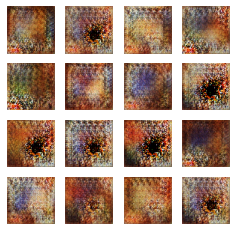

139/139 [==============================] - 153s 1s/step - d_loss: -53.2114 - g_loss: 732.8029
Epoch 48/100
139/139 [==============================] - ETA: 0s - d_loss: -52.1602 - g_loss: 850.1377

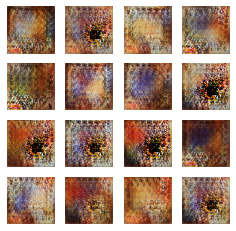

139/139 [==============================] - 153s 1s/step - d_loss: -52.1602 - g_loss: 850.1377
Epoch 49/100
139/139 [==============================] - ETA: 0s - d_loss: -51.8882 - g_loss: 646.9419

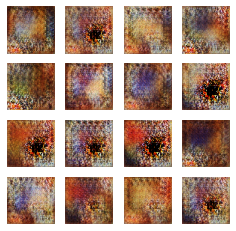

139/139 [==============================] - 154s 1s/step - d_loss: -51.8882 - g_loss: 646.9419
Epoch 50/100
139/139 [==============================] - ETA: 0s - d_loss: -48.8579 - g_loss: 628.9919

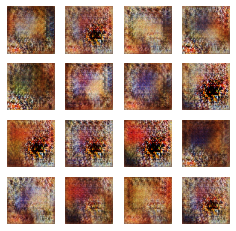

139/139 [==============================] - 153s 1s/step - d_loss: -48.8579 - g_loss: 628.9919
Epoch 51/100
139/139 [==============================] - ETA: 0s - d_loss: -47.3817 - g_loss: 792.2738

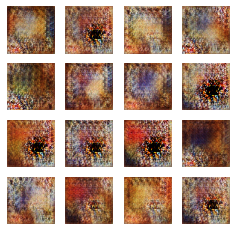

139/139 [==============================] - 153s 1s/step - d_loss: -47.3817 - g_loss: 792.2738
Epoch 52/100
139/139 [==============================] - ETA: 0s - d_loss: -47.5705 - g_loss: 708.1569

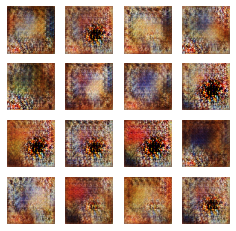

139/139 [==============================] - 153s 1s/step - d_loss: -47.5705 - g_loss: 708.1569
Epoch 53/100
139/139 [==============================] - ETA: 0s - d_loss: -44.0216 - g_loss: 383.2528

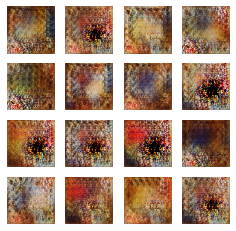

139/139 [==============================] - 153s 1s/step - d_loss: -44.0216 - g_loss: 383.2528
Epoch 54/100
139/139 [==============================] - ETA: 0s - d_loss: -44.3483 - g_loss: 143.6074

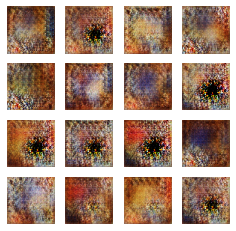

139/139 [==============================] - 153s 1s/step - d_loss: -44.3483 - g_loss: 143.6074
Epoch 55/100
139/139 [==============================] - ETA: 0s - d_loss: -40.8749 - g_loss: 589.5309

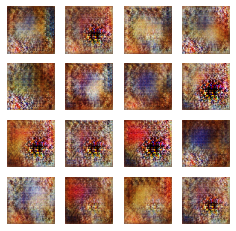

139/139 [==============================] - 154s 1s/step - d_loss: -40.8749 - g_loss: 589.5309
Epoch 56/100
139/139 [==============================] - ETA: 0s - d_loss: -44.6885 - g_loss: 584.0479

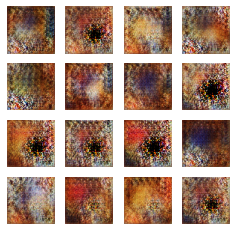

139/139 [==============================] - 153s 1s/step - d_loss: -44.6885 - g_loss: 584.0479
Epoch 57/100
139/139 [==============================] - ETA: 0s - d_loss: -44.2364 - g_loss: 992.2894

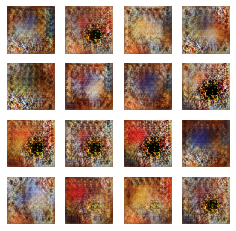

139/139 [==============================] - 153s 1s/step - d_loss: -44.2364 - g_loss: 992.2894
Epoch 58/100
139/139 [==============================] - ETA: 0s - d_loss: -45.6212 - g_loss: 410.2686

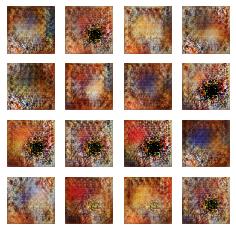

139/139 [==============================] - 153s 1s/step - d_loss: -45.6212 - g_loss: 410.2686
Epoch 59/100
139/139 [==============================] - ETA: 0s - d_loss: -43.5073 - g_loss: 627.4393

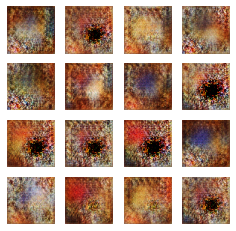

139/139 [==============================] - 153s 1s/step - d_loss: -43.5073 - g_loss: 627.4393
Epoch 60/100
139/139 [==============================] - ETA: 0s - d_loss: -44.7128 - g_loss: -13.2991

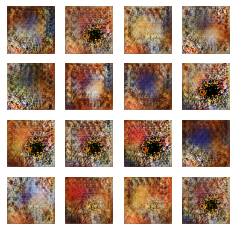

139/139 [==============================] - 153s 1s/step - d_loss: -44.7128 - g_loss: -13.2991
Epoch 61/100
139/139 [==============================] - ETA: 0s - d_loss: -43.7090 - g_loss: 292.9259

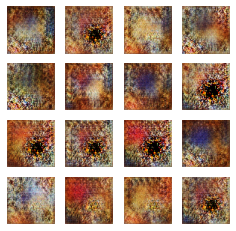

139/139 [==============================] - 153s 1s/step - d_loss: -43.7090 - g_loss: 292.9259
Epoch 62/100
139/139 [==============================] - ETA: 0s - d_loss: -46.4290 - g_loss: -39.2854

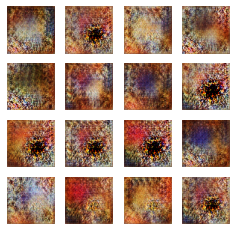

139/139 [==============================] - 153s 1s/step - d_loss: -46.4290 - g_loss: -39.2854
Epoch 63/100
139/139 [==============================] - ETA: 0s - d_loss: -42.9679 - g_loss: 664.6196

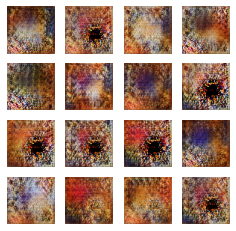

139/139 [==============================] - 153s 1s/step - d_loss: -42.9679 - g_loss: 664.6196
Epoch 64/100
139/139 [==============================] - ETA: 0s - d_loss: -41.5040 - g_loss: 875.1862

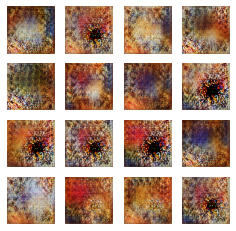

139/139 [==============================] - 153s 1s/step - d_loss: -41.5040 - g_loss: 875.1862
Epoch 65/100
139/139 [==============================] - ETA: 0s - d_loss: -37.2262 - g_loss: 853.0789

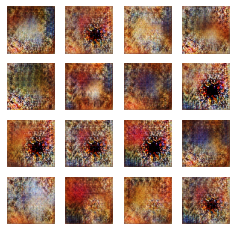

139/139 [==============================] - 154s 1s/step - d_loss: -37.2262 - g_loss: 853.0789
Epoch 66/100
139/139 [==============================] - ETA: 0s - d_loss: -39.4062 - g_loss: 970.1425

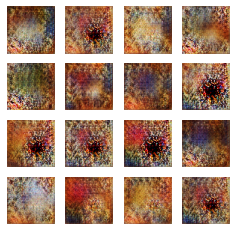

139/139 [==============================] - 153s 1s/step - d_loss: -39.4062 - g_loss: 970.1425
Epoch 67/100
139/139 [==============================] - ETA: 0s - d_loss: -39.0741 - g_loss: 621.7547

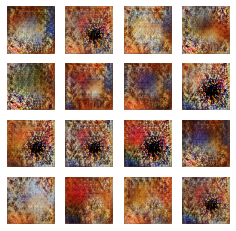

139/139 [==============================] - 153s 1s/step - d_loss: -39.0741 - g_loss: 621.7547
Epoch 68/100
139/139 [==============================] - ETA: 0s - d_loss: -39.1727 - g_loss: 303.9553

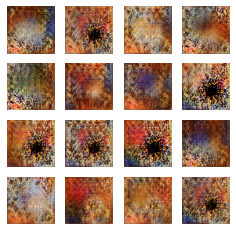

139/139 [==============================] - 153s 1s/step - d_loss: -39.1727 - g_loss: 303.9553
Epoch 69/100
139/139 [==============================] - ETA: 0s - d_loss: -35.4386 - g_loss: 313.8141

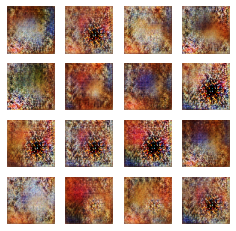

139/139 [==============================] - 153s 1s/step - d_loss: -35.4386 - g_loss: 313.8141
Epoch 70/100
139/139 [==============================] - ETA: 0s - d_loss: -37.2414 - g_loss: 39.7420

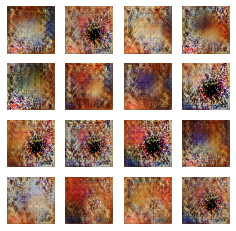

139/139 [==============================] - 153s 1s/step - d_loss: -37.2414 - g_loss: 39.7420
Epoch 71/100
139/139 [==============================] - ETA: 0s - d_loss: -32.9401 - g_loss: 805.9686

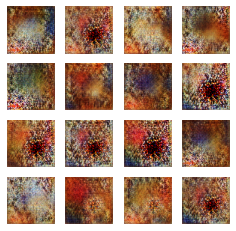

139/139 [==============================] - 154s 1s/step - d_loss: -32.9401 - g_loss: 805.9686
Epoch 72/100
139/139 [==============================] - ETA: 0s - d_loss: -33.5614 - g_loss: 148.1375

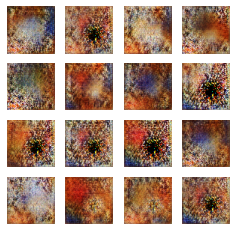

139/139 [==============================] - 153s 1s/step - d_loss: -33.5614 - g_loss: 148.1375
Epoch 73/100
139/139 [==============================] - ETA: 0s - d_loss: -36.9487 - g_loss: -4.4363 

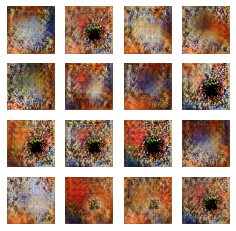

139/139 [==============================] - 153s 1s/step - d_loss: -36.9487 - g_loss: -4.4363
Epoch 74/100
139/139 [==============================] - ETA: 0s - d_loss: -31.6129 - g_loss: 322.0453

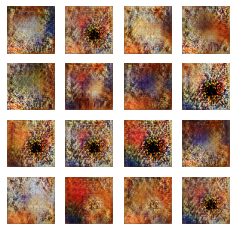

139/139 [==============================] - 153s 1s/step - d_loss: -31.6129 - g_loss: 322.0453
Epoch 75/100
139/139 [==============================] - ETA: 0s - d_loss: -32.1750 - g_loss: 247.5045

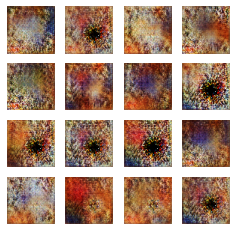

139/139 [==============================] - 153s 1s/step - d_loss: -32.1750 - g_loss: 247.5045
Epoch 76/100
139/139 [==============================] - ETA: 0s - d_loss: -31.8110 - g_loss: 53.7225

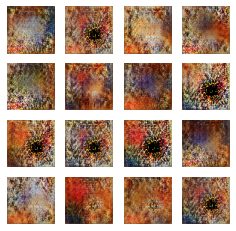

139/139 [==============================] - 154s 1s/step - d_loss: -31.8110 - g_loss: 53.7225
Epoch 77/100
139/139 [==============================] - ETA: 0s - d_loss: -31.2991 - g_loss: 424.1639

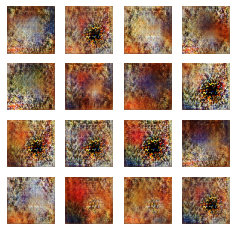

139/139 [==============================] - 153s 1s/step - d_loss: -31.2991 - g_loss: 424.1639
Epoch 78/100
139/139 [==============================] - ETA: 0s - d_loss: -31.3190 - g_loss: 396.0273

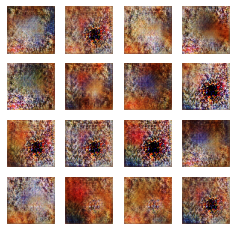

139/139 [==============================] - 153s 1s/step - d_loss: -31.3190 - g_loss: 396.0273
Epoch 79/100
139/139 [==============================] - ETA: 0s - d_loss: -29.6458 - g_loss: 401.7615

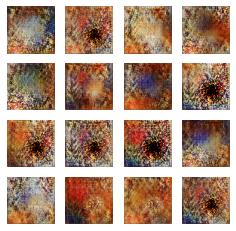

139/139 [==============================] - 154s 1s/step - d_loss: -29.6458 - g_loss: 401.7615
Epoch 80/100
139/139 [==============================] - ETA: 0s - d_loss: -26.7571 - g_loss: 473.0184

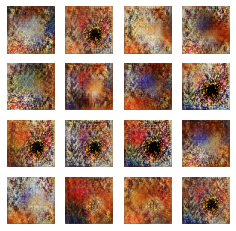

139/139 [==============================] - 154s 1s/step - d_loss: -26.7571 - g_loss: 473.0184
Epoch 81/100
139/139 [==============================] - ETA: 0s - d_loss: -28.2539 - g_loss: 305.7119

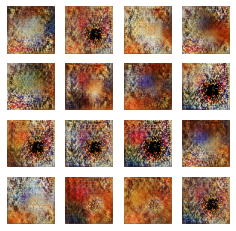

139/139 [==============================] - 154s 1s/step - d_loss: -28.2539 - g_loss: 305.7119
Epoch 82/100
139/139 [==============================] - ETA: 0s - d_loss: -26.8948 - g_loss: 406.5932

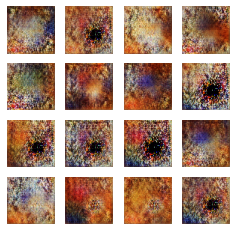

139/139 [==============================] - 153s 1s/step - d_loss: -26.8948 - g_loss: 406.5932
Epoch 83/100
139/139 [==============================] - ETA: 0s - d_loss: -29.2532 - g_loss: -86.5679

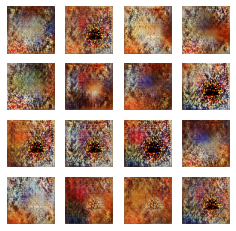

139/139 [==============================] - 154s 1s/step - d_loss: -29.2532 - g_loss: -86.5679
Epoch 84/100
139/139 [==============================] - ETA: 0s - d_loss: -27.1984 - g_loss: -29.1381

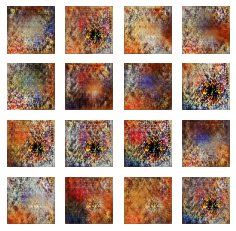

139/139 [==============================] - 153s 1s/step - d_loss: -27.1984 - g_loss: -29.1381
Epoch 85/100
139/139 [==============================] - ETA: 0s - d_loss: -28.9118 - g_loss: 200.4073

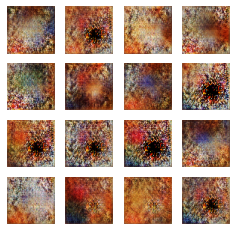

139/139 [==============================] - 153s 1s/step - d_loss: -28.9118 - g_loss: 200.4073
Epoch 86/100
139/139 [==============================] - ETA: 0s - d_loss: -30.6303 - g_loss: 376.9445

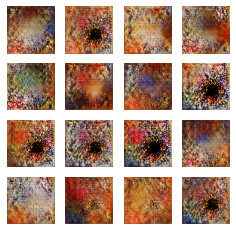

139/139 [==============================] - 153s 1s/step - d_loss: -30.6303 - g_loss: 376.9445
Epoch 87/100
139/139 [==============================] - ETA: 0s - d_loss: -29.7066 - g_loss: 325.5183

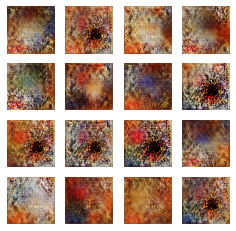

139/139 [==============================] - 154s 1s/step - d_loss: -29.7066 - g_loss: 325.5183
Epoch 88/100
139/139 [==============================] - ETA: 0s - d_loss: -24.4033 - g_loss: 553.0384

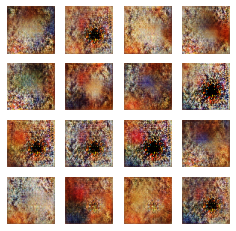

139/139 [==============================] - 153s 1s/step - d_loss: -24.4033 - g_loss: 553.0384
Epoch 89/100
139/139 [==============================] - ETA: 0s - d_loss: -23.1251 - g_loss: 462.4672

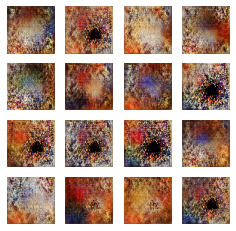

139/139 [==============================] - 153s 1s/step - d_loss: -23.1251 - g_loss: 462.4672
Epoch 90/100
139/139 [==============================] - ETA: 0s - d_loss: -25.1104 - g_loss: 511.2639

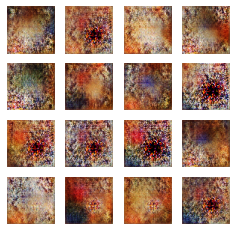

139/139 [==============================] - 154s 1s/step - d_loss: -25.1104 - g_loss: 511.2639
Epoch 91/100
139/139 [==============================] - ETA: 0s - d_loss: -28.4668 - g_loss: 352.6938

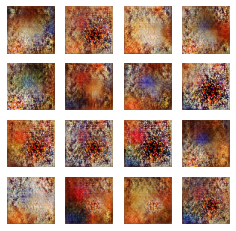

139/139 [==============================] - 153s 1s/step - d_loss: -28.4668 - g_loss: 352.6938
Epoch 92/100
139/139 [==============================] - ETA: 0s - d_loss: -25.9313 - g_loss: 409.2856

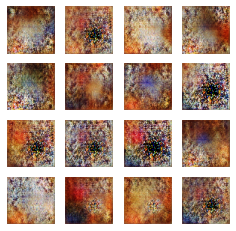

139/139 [==============================] - 154s 1s/step - d_loss: -25.9313 - g_loss: 409.2856
Epoch 93/100
139/139 [==============================] - ETA: 0s - d_loss: -29.7313 - g_loss: 61.5019

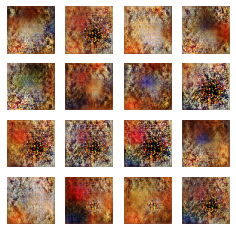

139/139 [==============================] - 153s 1s/step - d_loss: -29.7313 - g_loss: 61.5019
Epoch 94/100
139/139 [==============================] - ETA: 0s - d_loss: -29.8526 - g_loss: 109.1948

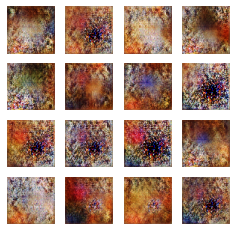

139/139 [==============================] - 153s 1s/step - d_loss: -29.8526 - g_loss: 109.1948
Epoch 95/100
139/139 [==============================] - ETA: 0s - d_loss: -24.5277 - g_loss: 380.0078

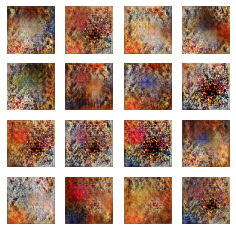

139/139 [==============================] - 153s 1s/step - d_loss: -24.5277 - g_loss: 380.0078
Epoch 96/100
139/139 [==============================] - ETA: 0s - d_loss: -30.8442 - g_loss: 581.2909

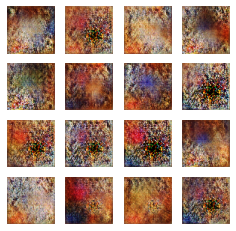

139/139 [==============================] - 153s 1s/step - d_loss: -30.8442 - g_loss: 581.2909
Epoch 97/100
139/139 [==============================] - ETA: 0s - d_loss: -35.5790 - g_loss: -107.0657

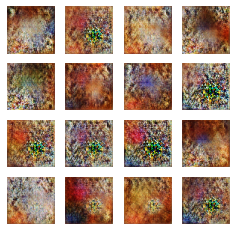

139/139 [==============================] - 153s 1s/step - d_loss: -35.5790 - g_loss: -107.0657
Epoch 98/100
139/139 [==============================] - ETA: 0s - d_loss: -25.9973 - g_loss: -323.1543

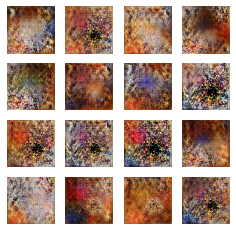

139/139 [==============================] - 153s 1s/step - d_loss: -25.9973 - g_loss: -323.1543
Epoch 99/100
139/139 [==============================] - ETA: 0s - d_loss: -27.3756 - g_loss: -78.2878

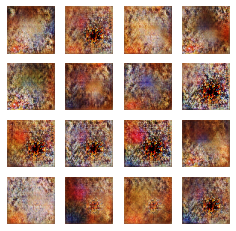

139/139 [==============================] - 153s 1s/step - d_loss: -27.3756 - g_loss: -78.2878
Epoch 100/100
139/139 [==============================] - ETA: 0s - d_loss: -23.1886 - g_loss: 784.4946

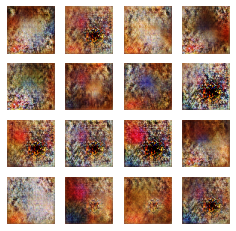

139/139 [==============================] - 153s 1s/step - d_loss: -23.1886 - g_loss: 784.4946


In [ ]:
NUM_EPOCHS = 100 # number of epochs
wgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])